In [19]:
import os
import sys
import numpy as np
import pandas as pd
import torch.nn as nn
import torch
from sklearn.metrics import f1_score, confusion_matrix, log_loss, roc_auc_score, accuracy_score, cohen_kappa_score
from matplotlib import patches
from matplotlib import pyplot as plt
from tqdm.notebook import tqdm
from wholeslidedata.annotation.parser import MaskAnnotationParser
from wholeslidedata.image.wholeslideimage import WholeSlideImage
from wholeslidedata.annotation.wholeslideannotation import WholeSlideAnnotation
from wholeslidedata.iterators import create_batch_iterator
import segmentation_models_pytorch as smp
import yaml
import seaborn as sns

from wholeslidedata.samplers.utils import plot_mask
from matplotlib import pyplot as plt
import matplotlib.patches as mpatches

sys.path.insert(1, os.path.join(sys.path[0], '..'))
from utils import load_config, crop_center, plot_batch, colors_1, colors_2, mean_metrics
from utils import plot_confusion_matrix, plot_pred_batch
from label_utils import to_dysplastic_vs_non_dysplastic
from preprocessing import tissue_mask_batch, get_preprocessing

from train_ensemble import load_model, Ensemble
from train_classification import load_trained_segmentation_model
from confidence_calibration import avg_entropy_sk, plot_class_probabilities_sample, plot_pred_sample, ece, brier_score
from metrics_lib import brier_scores, expected_calibration_error_multiclass, _validate_probabilities, brier_scores

### In this notebook we evaluate the effect of ensembling on internal test set in terms of:
 1. **Segmentation performance** with
     * Dice per Class
     * Confusion Matrix
 2. **Patch classification (max grade present) performance** with
     * Quadratic weighted kappa
     * Confusion Matrix
 3. **Calibration quality** with:
     * ECE
     * NLL
     * Brier Score
 3. Assess whether $\overline{\mathcal{H}\left(\hat{\mathcal{S}}_k\right)}$ is a good predictor for max grade estimation

In [2]:
class single_Model:
    def __init__(self, model):
        self.model = model
        
    def forward(self, x, y):
        """
        Args:
            x:
                torch.tensor: (B, H, W)
            y:

        Returns:
            y_avg_prob: 
                np.array (B, C, H, W)
        """
        
        y_pred_batch = model(x)
        y_avg_prob = torch.nn.functional.softmax(y_pred_batch, dim=1).cpu().detach().numpy()
        
        return y_avg_prob

In [3]:
# sliding window config for inference                           
test_config = '/home/mbotros/code/barrett_gland_grading/configs/test_config.yml'
print('Loading config: {}'.format(test_config))

# create a test iterator
test_iterator = create_batch_iterator(mode='test',
                                      user_config=test_config,
                                      cpus=1,
                                      number_of_batches=-1,
                                      return_info=True)

Loading config: /home/mbotros/code/barrett_gland_grading/configs/test_config.yml


In [4]:
def avg_entropy_sk_per_patch(y_pred):
    """ Compute the average entropy per patch in a batch
    
    Args: 
        y_pred: (B, C, H, W)
    
    Returns:
        h: (B, C)
    """
    h = np.zeros((y_pred.shape[0], y_pred.shape[1]))
    
    for i, y_pred_patch in enumerate(y_pred): 
        y_pred_patch = np.transpose(y_pred_patch, (1, 2, 0)).reshape(-1, y_pred.shape[1])
        h[i] = avg_entropy_sk(y_pred_patch)
        
    return h

In [13]:
def test_model(model, test_iterator, preprocessing, device, plot_freq=10):
    
    outputs = {}
    metrics = {}
    
    with torch.no_grad():
        for idx, (x_np, y_np, info) in enumerate(tqdm(test_iterator)):

            # tissue masking and preprocessing
            y_np = tissue_mask_batch(x_np, y_np)
            sample = preprocessing(image=x_np, mask=y_np)
            x, y = sample['image'].to(device), sample['mask'].to(device)

            # forward: out is probs (B, C, H, W) 
            y_hat = model.forward(x, y)
    
            # store one example
            sample_x = x_np[0]                                      
            sample_y = y_np[0]
            sample_y_hat = y_hat[0]  
            
            # labels for patch classification
            y_true_max_grade = np.max(y_np, axis=(1, 2))                           # (B, )
            y_pred_max_grade = np.max(np.argmax(y_hat, axis=1), axis=(1, 2))       # (B, )
            y_prob_max_grade = np.mean(y_hat, axis=(2, 3))                         # (B, C) 
            _validate_probabilities(y_prob_max_grade)

            # labels on pixel level
            y_true = y.cpu().detach().numpy().flatten()                                           # (B, H, W)     => (N,)
            y_pred = np.argmax(y_hat, axis=1).flatten()                                           # (B, C, H, W)  => (N,)
            y_prob = np.transpose(y_hat, (0, 2, 3, 1)).reshape(-1, y_hat.shape[1])                # (B, C, H, W)  => (N, C)
            _validate_probabilities(y_prob)
            
            # store outputs per patch
            outputs[idx] = {'max grades true': y_true_max_grade,
                            'max grades pred': y_pred_max_grade,
                            'max grades prob': y_prob_max_grade,
                            'avg entropy per patch': avg_entropy_sk_per_patch(y_hat)}
            
            # compute metrics over the batch
            metrics[idx] = {'nll': log_loss(y_true, y_prob, labels=[0, 1, 2, 3]),
                                 'dice per class': f1_score(y_true, y_pred, average=None, labels=[0, 1, 2, 3]),
                                 'dice weighted': f1_score(y_true, y_pred, average='weighted'),
                                 'confusion matrix pixel classification': confusion_matrix(y_true, y_pred, normalize='true'),
                                 'ece': expected_calibration_error_multiclass(probabilities=y_prob, labels=y_true, bins=10, top_k=None),
                                 'brier': brier_score(y_true, y_prob),
                                 'avg entropy': avg_entropy_sk(y_prob),                                                                # over the whole batch
                                 'max grade kappa': cohen_kappa_score(y_true_max_grade, y_pred_max_grade, weights='quadratic'),        # patch classification
                                 'max grade acc': accuracy_score(y_true_max_grade, y_pred_max_grade),
                                 'confusion matrix patch classification': confusion_matrix(y_true_max_grade, y_pred_max_grade, normalize='true', labels=[1, 2, 3])}
    
            # plot predictions every 10 batches
            if idx % plot_freq == 1:
                plot_pred_sample(sample_x, sample_y, sample_y_hat)
                sample_y_hat = np.swapaxes(y_hat[0].reshape(*y_hat[0].shape[:-2], -1), 0, 1)                 # (N, C)
                plot_class_probabilities_sample(y_true=sample_y.flatten(),  y_pred=sample_y_hat)
                  
    return outputs, metrics

#### **One** UNet++_EfficientNet-b4_sp=1_ps=512_bs=32 (trained with Dice + CCE, **ImageNet pretrained**)

Loading model: unet++, weights: imagenet
Loaded model from /data/archief/AMC-data/Barrett/experiments/barrett_gland_grading/3_classes/UNet++_EfficientNet-b4_sp=1_ps=512_bs=32/checkpoints/model_epoch_146_loss_0.739_dice_0.711.pt
During training we used efficientnet-b4 as encoder with weights from imagenet.


  0%|          | 0/23 [00:00<?, ?it/s]

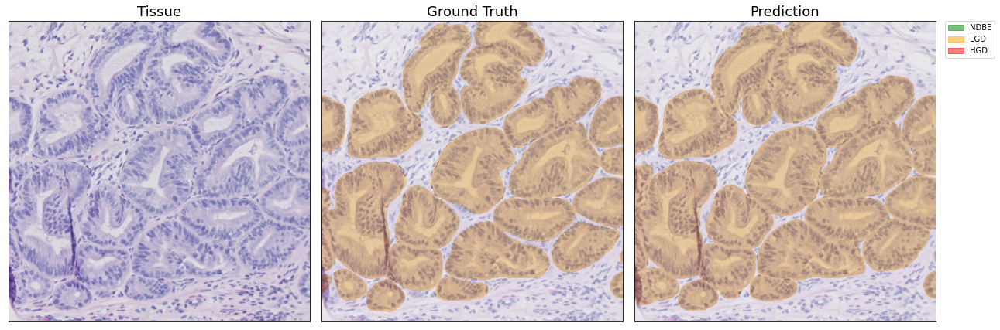

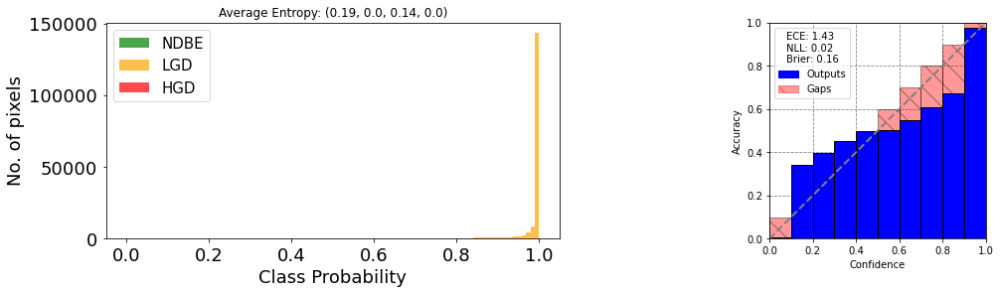

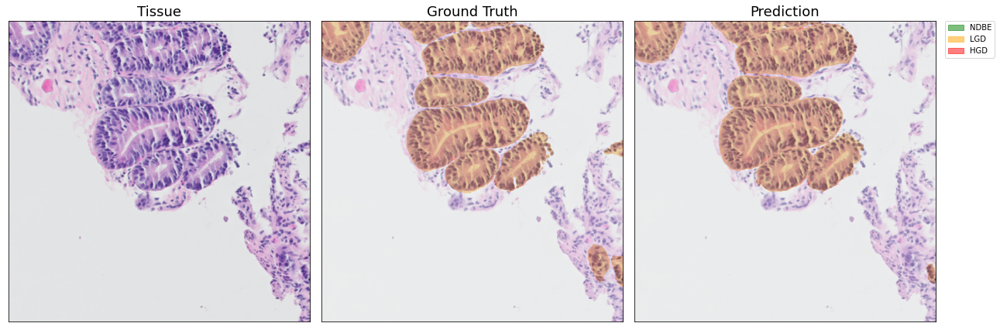

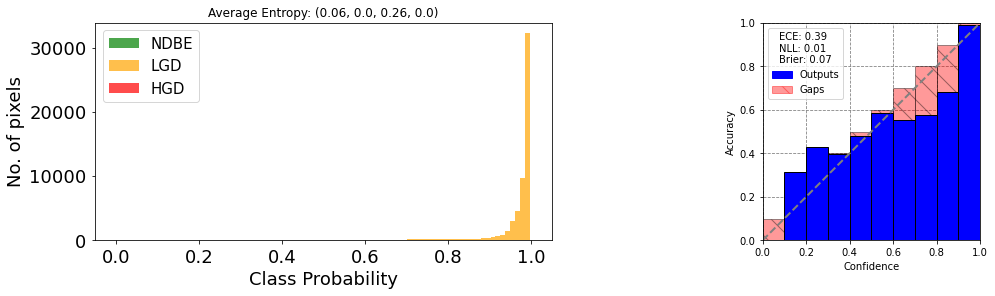

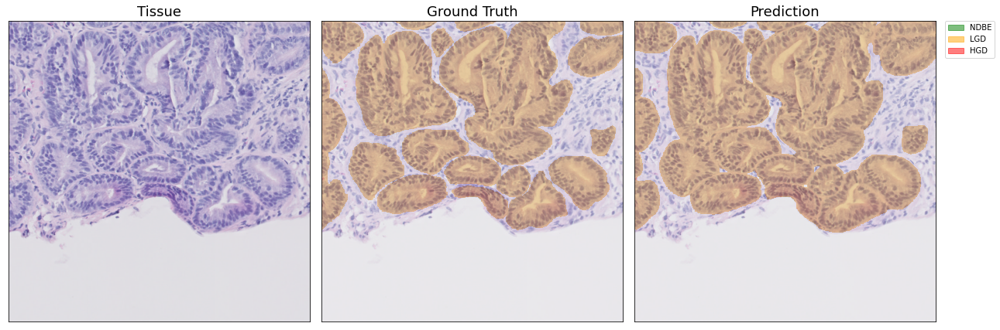

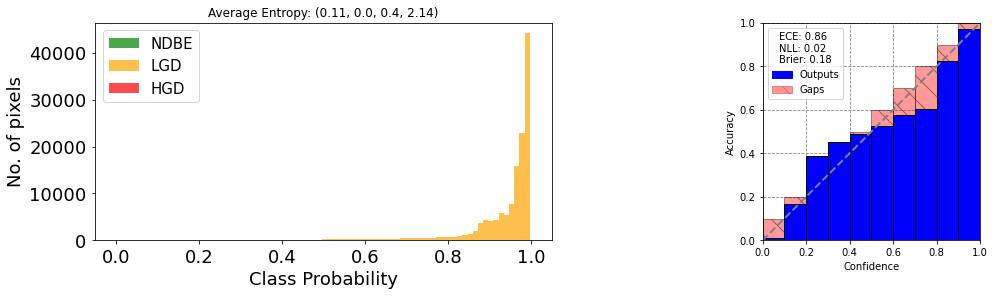

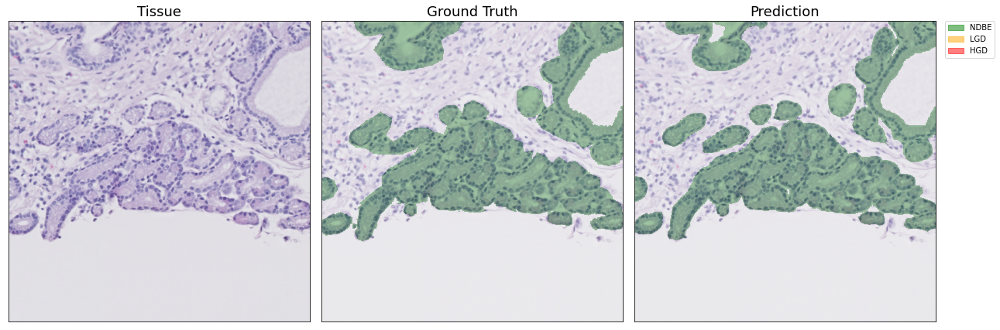

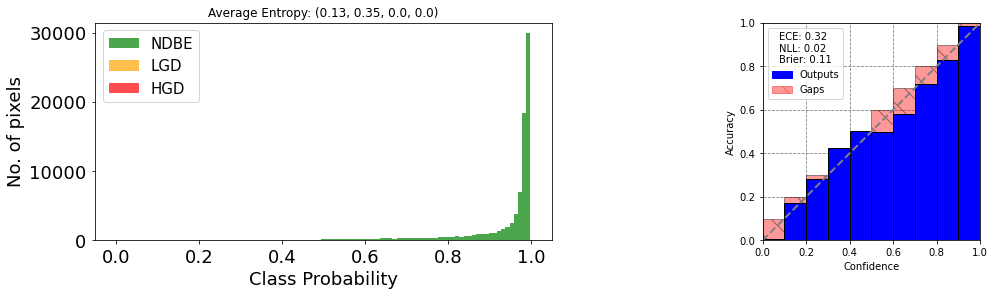

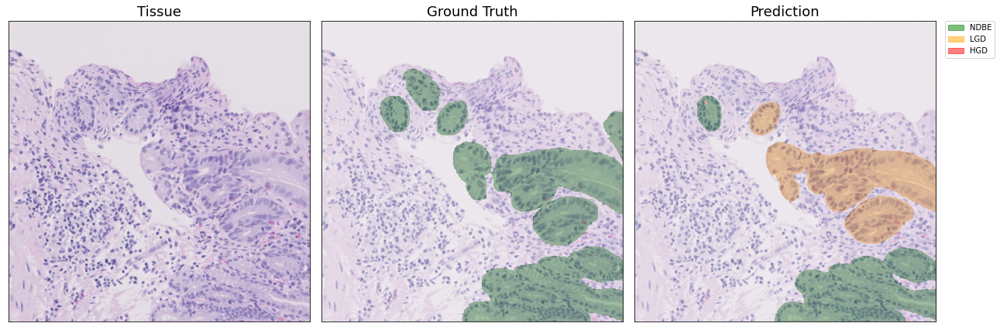

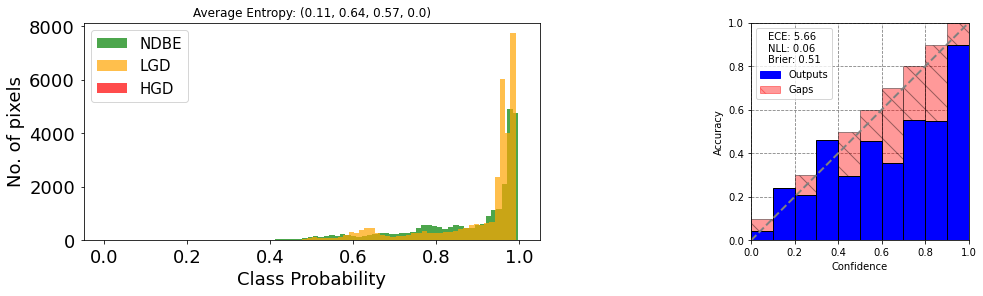

In [14]:
# load model and ImageNet preprocessing
exp_dir = '/data/archief/AMC-data/Barrett/experiments/barrett_gland_grading/3_classes/UNet++_EfficientNet-b4_sp=1_ps=512_bs=32/'
model_path = os.path.join(exp_dir, 'checkpoints/model_epoch_146_loss_0.739_dice_0.711.pt')
model, preprocessing = load_trained_segmentation_model(exp_dir, model_path)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
model = nn.DataParallel(model)
model.to(device)
m1_IM_pretrained = single_Model(model)

# test
test_results_m1_IM = test_model(m1_IM_pretrained, test_iterator, preprocessing, device, plot_freq=5)

#### **One** UNet++_EfficientNet-b4_sp=1_ps=512_bs=32 (trained with Dice, **Random Init**)

Loading model: unet++, weights: None
Loaded model from: /data/archief/AMC-data/Barrett/experiments/barrett_gland_grading/3_classes/Ensemble_m10_UNet++/net_0/checkpoints/best_model.pt



  0%|          | 0/23 [00:00<?, ?it/s]

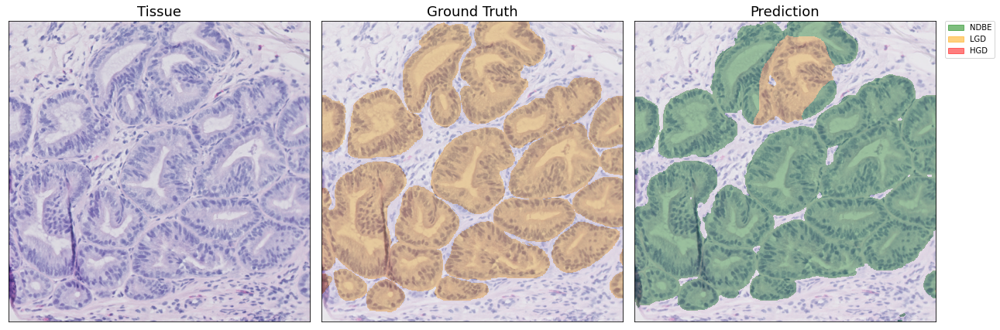

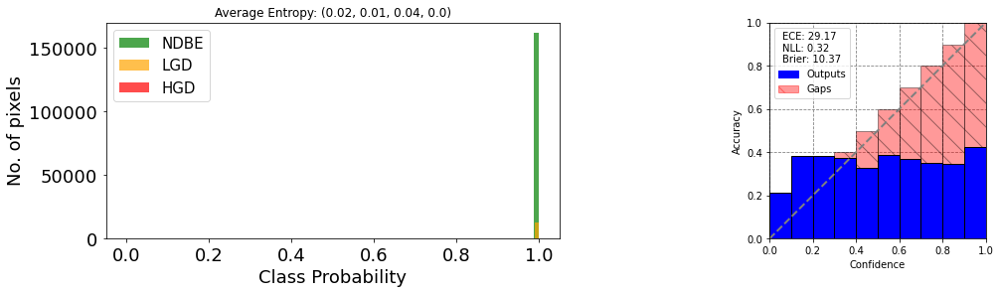

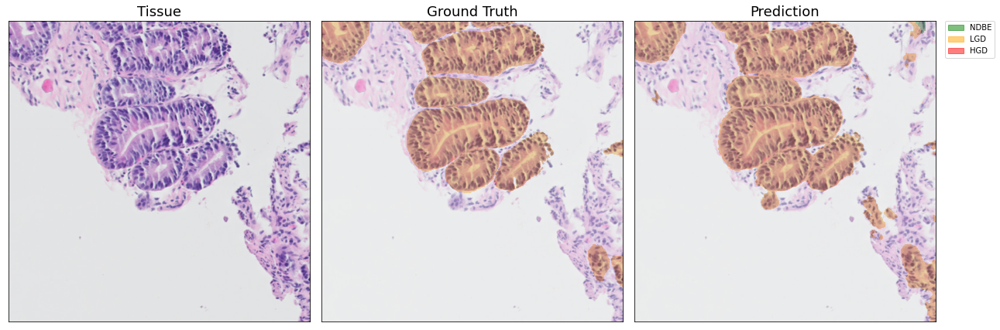

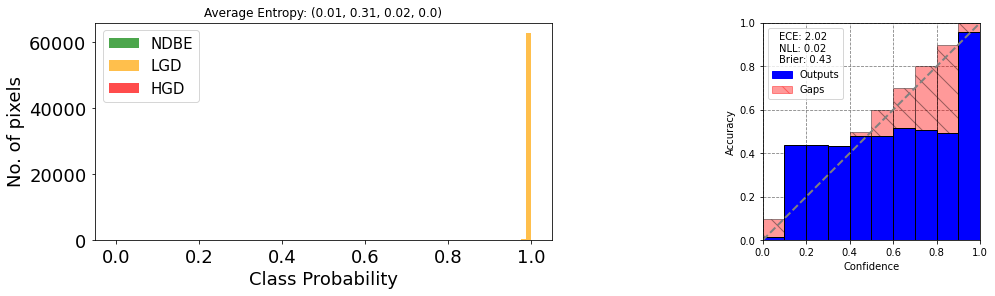

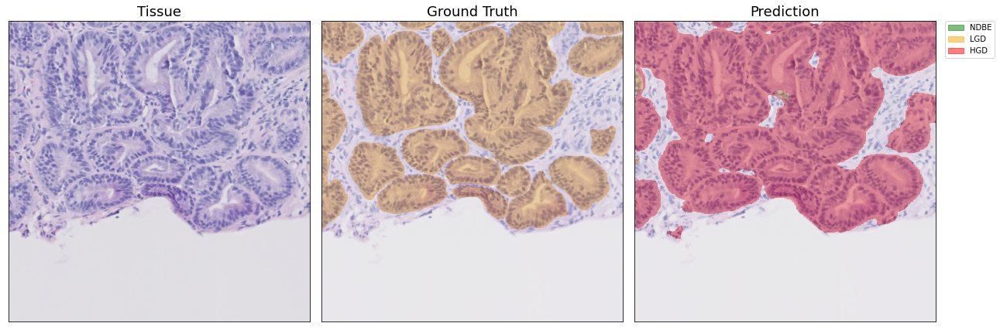

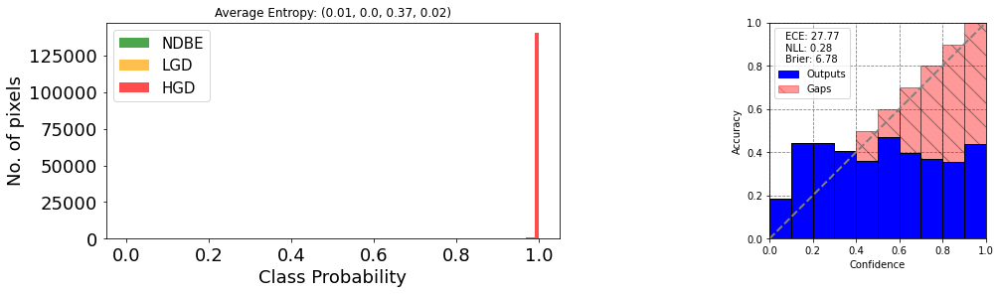

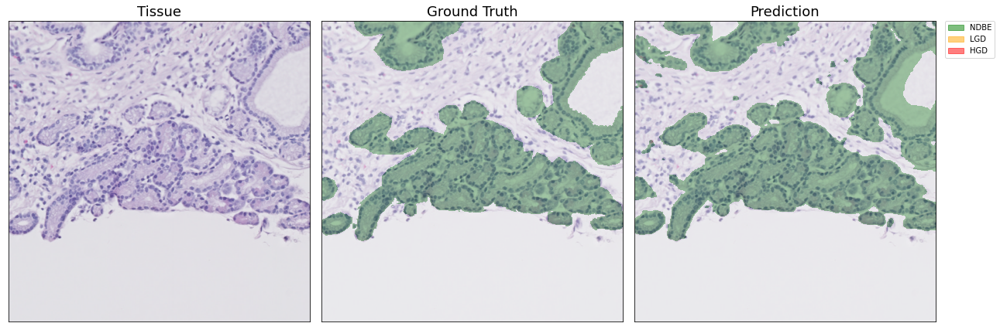

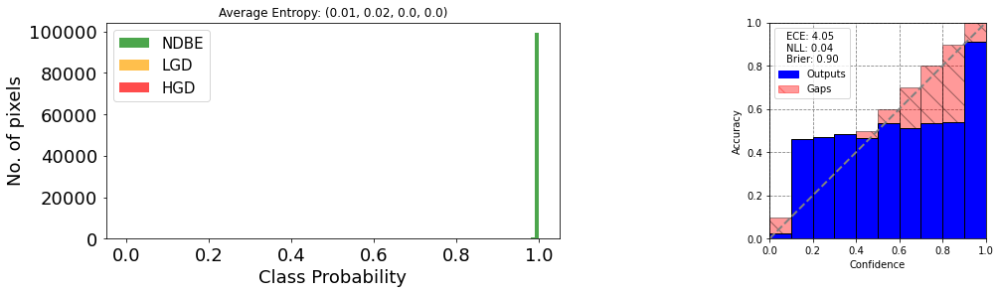

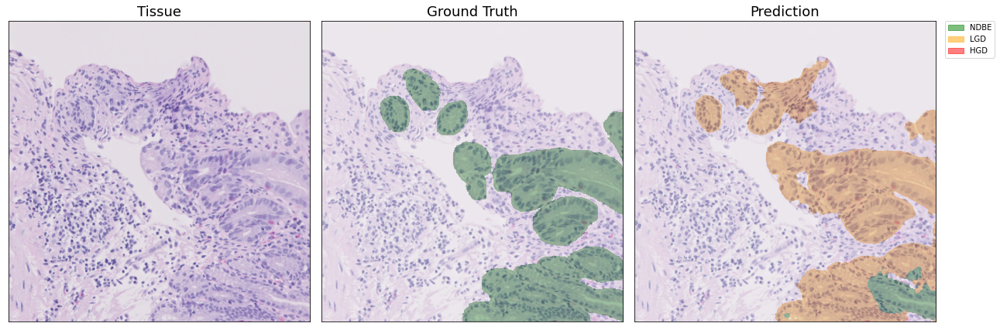

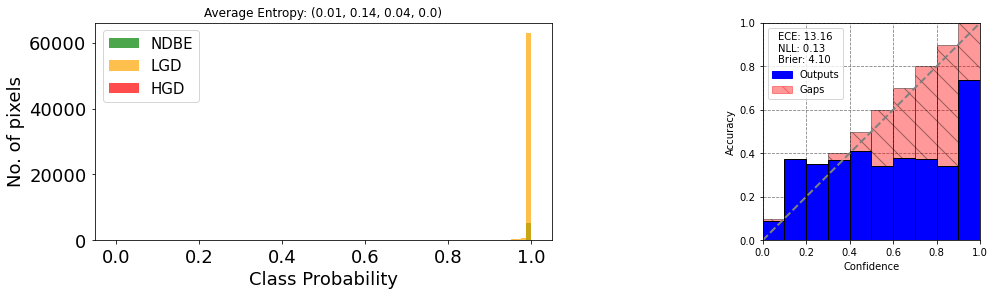

In [9]:
# load model, dont do any ImageNet specific preprocessing
exp_dir = '/data/archief/AMC-data/Barrett/experiments/barrett_gland_grading/3_classes/Ensemble_m10_UNet++/'
preprocessing = get_preprocessing()
ensemble_m1 = Ensemble(exp_dir, device=device, m=1)

# test
test_results_m1_random_init = test_model(ensemble_m1, test_iterator, preprocessing, device, plot_freq=5)

#### **Five** UNet++_EfficientNet-b4_sp=1_ps=512_bs=32 (trained with Dice, **Random Init**)

Loading model: unet++, weights: None
Loaded model from: /data/archief/AMC-data/Barrett/experiments/barrett_gland_grading/3_classes/Ensemble_m10_UNet++/net_0/checkpoints/best_model.pt

Loading model: unet++, weights: None
Loaded model from: /data/archief/AMC-data/Barrett/experiments/barrett_gland_grading/3_classes/Ensemble_m10_UNet++/net_1/checkpoints/best_model.pt

Loading model: unet++, weights: None
Loaded model from: /data/archief/AMC-data/Barrett/experiments/barrett_gland_grading/3_classes/Ensemble_m10_UNet++/net_2/checkpoints/best_model.pt

Loading model: unet++, weights: None
Loaded model from: /data/archief/AMC-data/Barrett/experiments/barrett_gland_grading/3_classes/Ensemble_m10_UNet++/net_3/checkpoints/best_model.pt

Loading model: unet++, weights: None
Loaded model from: /data/archief/AMC-data/Barrett/experiments/barrett_gland_grading/3_classes/Ensemble_m10_UNet++/net_4/checkpoints/best_model.pt



  0%|          | 0/23 [00:00<?, ?it/s]

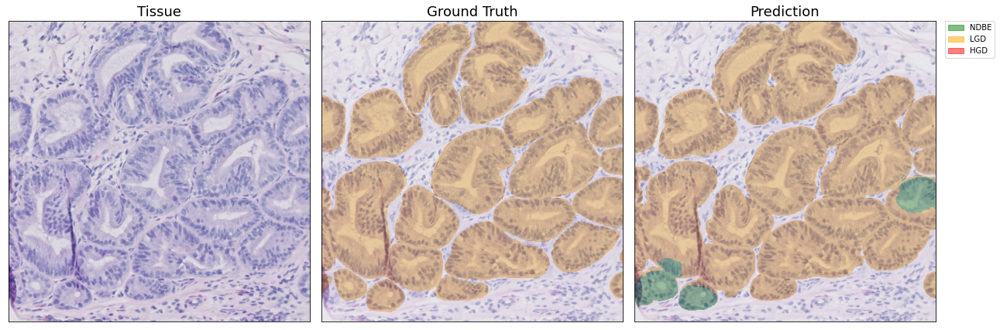

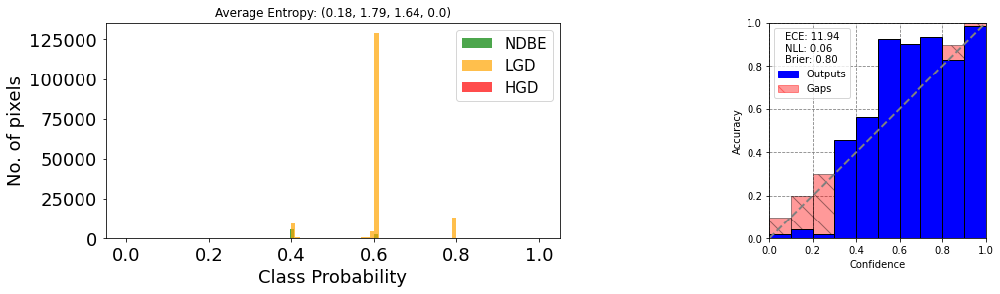

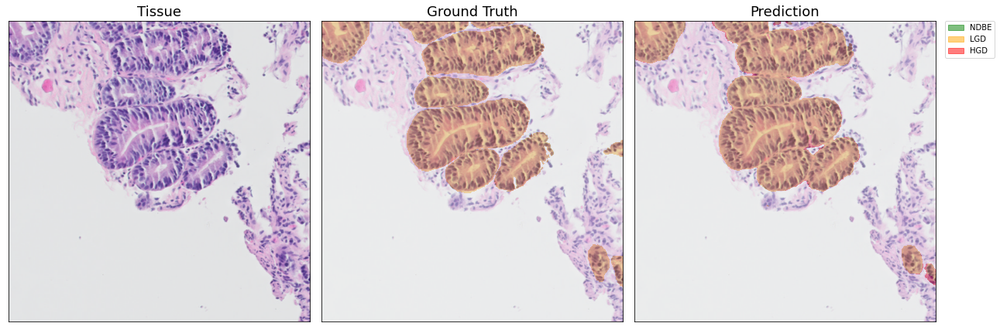

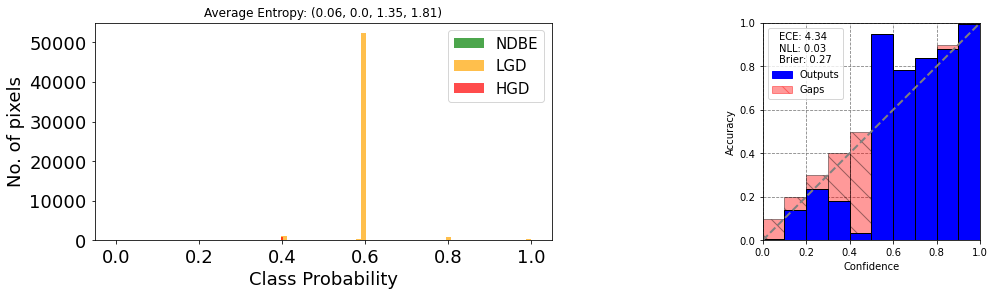

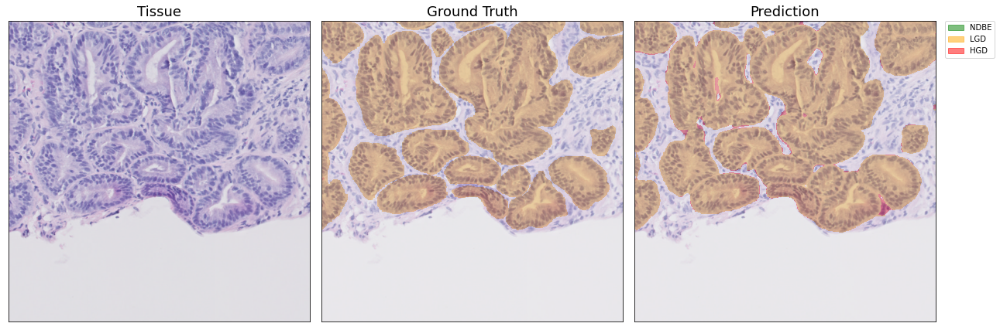

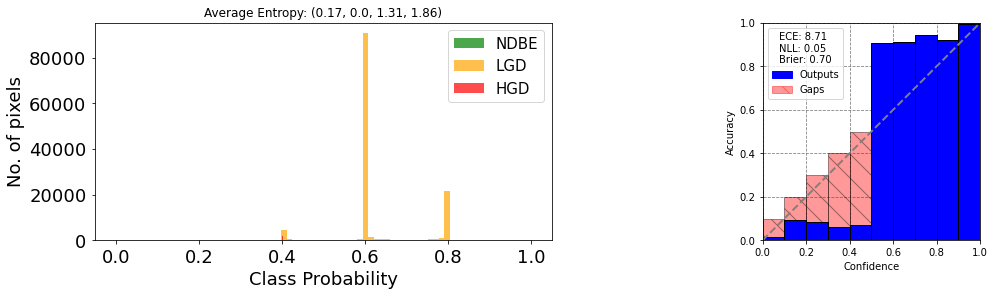

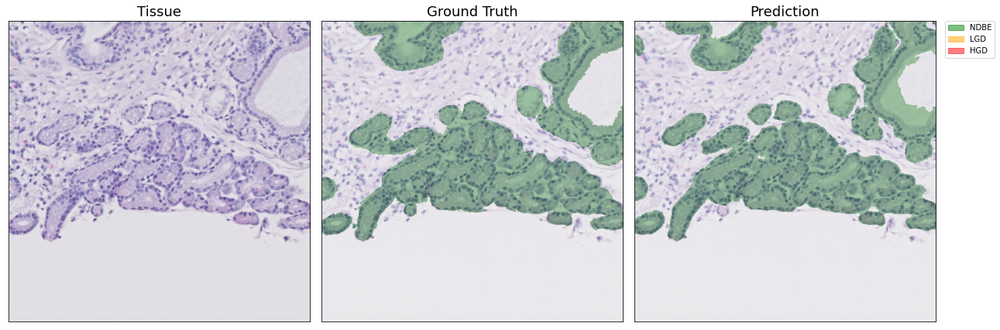

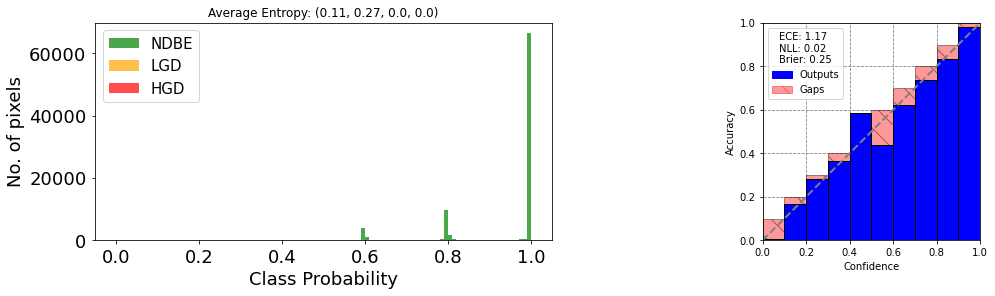

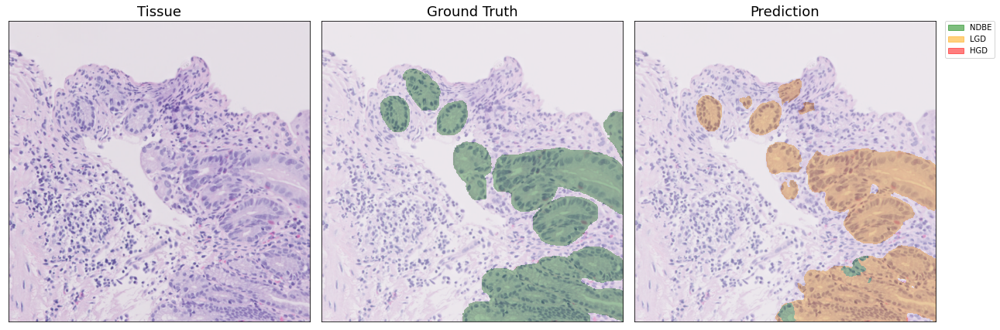

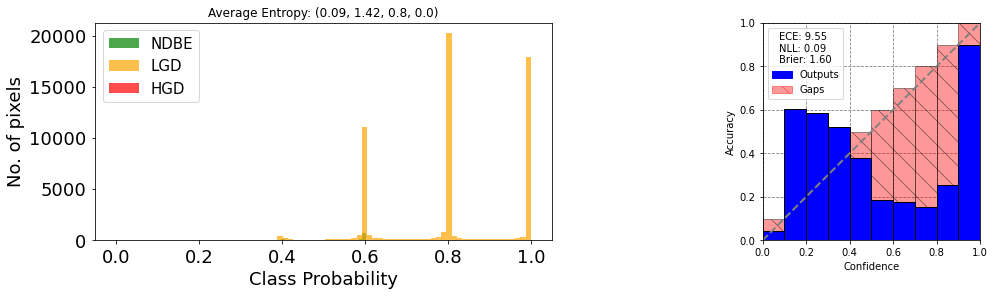

In [10]:
# load ensemble of 5 models
ensemble_m5 = Ensemble(exp_dir, device=device, m=5)

# test
test_results_m5_random_init = test_model(ensemble_m5, test_iterator, preprocessing, device, plot_freq=5)

In [15]:
test_results_m1_IM_pretrain_avg = mean_metrics(test_results_m1_IM[1])
test_results_m1_random_init_avg = mean_metrics(test_results_m1_random_init[1])
test_results_m5_random_init_avg = mean_metrics(test_results_m5_random_init[1])

print('m=1 (ImageNet pretrained)')
print("NLL: {:.3f}.".format(test_results_m1_IM_pretrain_avg['nll']))
print("ECE: {:.3f}.".format(test_results_m1_IM_pretrain_avg['ece']))
print("Brier: {:.3f}.".format(test_results_m1_IM_pretrain_avg['brier']))
print("Dice per class: {}.".format(np.round(test_results_m1_IM_pretrain_avg['dice per class'], decimals=3)))
print("Dice weighted: {:.3f}".format(test_results_m1_IM_pretrain_avg['dice weighted']))
print("Max grade accuracy patch classification: {:.3f}".format(test_results_m1_IM_pretrain_avg['max grade acc']))
print("Max grade kappa patch classification: {:.3f}".format(test_results_m1_IM_pretrain_avg['max grade kappa']))
print()

print('m=1 (from random init)')
print("NLL: {:.3f}.".format(test_results_m1_random_init_avg['nll']))
print("ECE: {:.3f}.".format(test_results_m1_random_init_avg['ece']))
print("Brier: {:.3f}.".format(test_results_m1_random_init_avg['brier']))
print("Dice per clss: {}.".format(np.round(test_results_m1_random_init_avg['dice per class'], decimals=3)))
print("Dice weighted: {:.3f}".format(test_results_m1_random_init_avg['dice weighted']))
print("Max grade accuracy patch classification: {:.3f}".format(test_results_m1_random_init_avg['max grade acc']))
print("Max grade kappa patch classification: {:.3f}".format(test_results_m1_random_init_avg['max grade kappa']))
print()
print('m=5 (from random init)')
print("NLL: {:.3f}.".format(test_results_m5_random_init_avg['nll']))
print("ECE: {:.3f}.".format(test_results_m5_random_init_avg['ece']))
print("Brier: {:.3f}.".format(test_results_m5_random_init_avg['brier']))
print("Dice per class: {}.".format(np.round(test_results_m5_random_init_avg['dice per class'], decimals=3)))
print("Dice weighted: {:.3f}".format(test_results_m5_random_init_avg['dice weighted']))
print("Max grade accuracy patch classification: {:.3f}".format(test_results_m5_random_init_avg['max grade acc']))
print("Max grade kappa patch classification: {:.3f}".format(test_results_m5_random_init_avg['max grade kappa']))

m=1 (ImageNet pretrained)
NLL: 0.563.
ECE: 0.046.
Brier: 0.060.
Dice per class: [0.955 0.841 0.632 0.572].
Dice weighted: 0.852
Max grade accuracy patch classification: 0.767
Max grade kappa patch classification: 0.803

m=1 (from random init)
NLL: 3.371.
ECE: 0.127.
Brier: 0.128.
Dice per clss: [0.897 0.748 0.275 0.497].
Dice weighted: 0.744
Max grade accuracy patch classification: 0.641
Max grade kappa patch classification: 0.692

m=5 (from random init)
NLL: 1.034.
ECE: 0.053.
Brier: 0.072.
Dice per class: [0.936 0.803 0.441 0.499].
Dice weighted: 0.796
Max grade accuracy patch classification: 0.680
Max grade kappa patch classification: 0.762


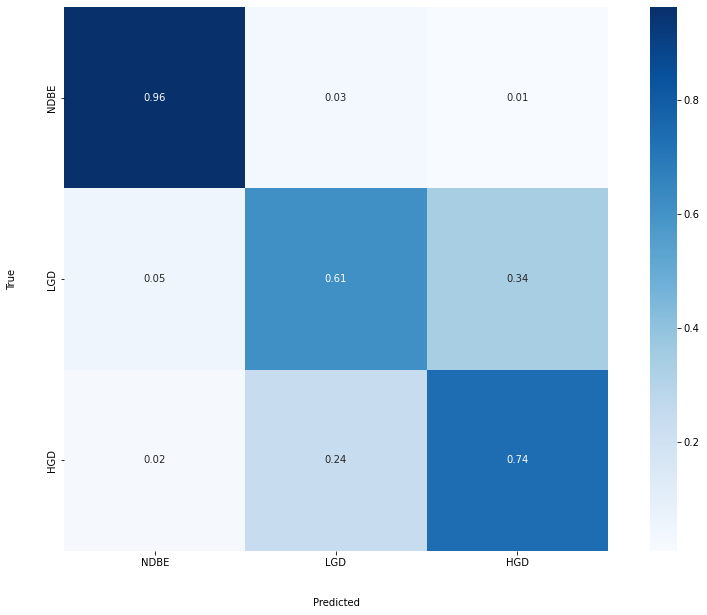

In [27]:
# only sampled patches from annotations with NBDE, LGD, HGD
plot_confusion_matrix(test_results_m1_IM_pretrain_avg['confusion matrix patch classification'], pixel_level=False)

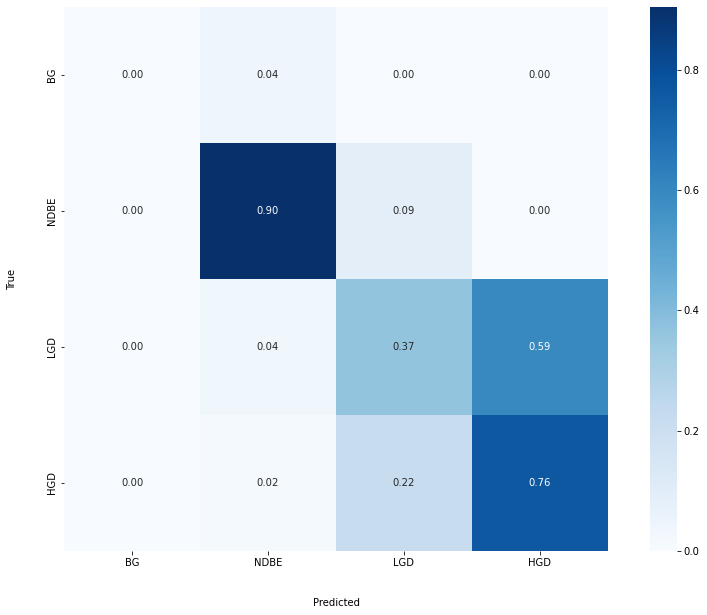

In [29]:
plot_confusion_matrix(test_results_m5_random_init_avg['confusion matrix patch classification'], pixel_level=True)

In [ ]:
# To-Do:
# Experiment with a classification head: How?
# Ensemble of CE
# Temp Scaling
# Cross Validation